Data Exploration

In [ ]:
import warnings
warnings.filterwarnings('ignore')

#'pandas' is used for data manipulation and analysis
import pandas as pd

#'Numpy' is used for mathematical operations on large, multi-dimensional arrays and matrices
import numpy as np

#'Matplotlib' is a data visualization library for 2D and 3D plots,built on numpy
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

#import various functions to perform classifications
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

#Classification models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
import xgboost # Add this line to import the main xgboost module
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn import metrics

# Preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
import imblearn # Add this line to import the main imblearn module
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE


In [ ]:
# @title
print("Pandas version:", pd.__version__)
print("Numpy version:", np.__version__)
print("Matplotlib version:", matplotlib.__version__)
print("Seaborn version:", sns.__version__)
print("sklearn version:", sklearn.__version__)
print("imblearn version:", imblearn.__version__)
print("xgboost version:", xgboost.__version__)


Pandas version: 2.2.2
Numpy version: 2.0.2
Matplotlib version: 3.10.0
Seaborn version: 0.13.2
sklearn version: 1.6.1
imblearn version: 0.14.0
xgboost version: 3.1.2


In [ ]:
df = pd.read_csv("/content/satisfiction.csv")
df

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,19556,Female,Loyal Customer,52,Business travel,Eco,160,5,4,...,5,5,5,5,2,5,5,50,44.0,very satisfied
1,1,90035,Female,Loyal Customer,36,Business travel,Business,2863,1,1,...,4,4,4,4,3,4,5,0,0.0,very satisfied
2,2,12360,Male,disloyal Customer,20,Business travel,Eco,192,2,0,...,2,4,1,3,2,2,2,0,0.0,neutral
3,3,77959,Male,Loyal Customer,44,Business travel,Business,3377,0,0,...,1,1,1,1,3,1,4,0,6.0,very satisfied
4,4,36875,Female,Loyal Customer,49,Business travel,Eco,1182,2,3,...,2,2,2,2,4,2,4,0,20.0,very satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25971,25971,78463,Male,disloyal Customer,34,Business travel,Business,526,3,3,...,4,3,2,4,4,5,4,0,0.0,neutral or dissatisfied
25972,25972,71167,Male,Loyal Customer,23,Business travel,Business,646,4,4,...,4,4,5,5,5,5,4,0,0.0,very satisfied
25973,25973,37675,Female,Loyal Customer,17,Personal Travel,Eco,828,2,5,...,2,4,3,4,5,4,2,0,0.0,neutral
25974,25974,90086,Male,Loyal Customer,14,Business travel,Business,1127,3,3,...,4,3,2,5,4,5,4,0,0.0,very satisfied


In [ ]:
#starting 5 rows 0 to 5
df.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,19556,Female,Loyal Customer,52,Business travel,Eco,160,5,4,...,5,5,5,5,2,5,5,50,44.0,very satisfied
1,1,90035,Female,Loyal Customer,36,Business travel,Business,2863,1,1,...,4,4,4,4,3,4,5,0,0.0,very satisfied
2,2,12360,Male,disloyal Customer,20,Business travel,Eco,192,2,0,...,2,4,1,3,2,2,2,0,0.0,neutral
3,3,77959,Male,Loyal Customer,44,Business travel,Business,3377,0,0,...,1,1,1,1,3,1,4,0,6.0,very satisfied
4,4,36875,Female,Loyal Customer,49,Business travel,Eco,1182,2,3,...,2,2,2,2,4,2,4,0,20.0,very satisfied


In [ ]:
#last 5 rows
df.tail()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
25971,25971,78463,Male,disloyal Customer,34,Business travel,Business,526,3,3,...,4,3,2,4,4,5,4,0,0.0,neutral or dissatisfied
25972,25972,71167,Male,Loyal Customer,23,Business travel,Business,646,4,4,...,4,4,5,5,5,5,4,0,0.0,very satisfied
25973,25973,37675,Female,Loyal Customer,17,Personal Travel,Eco,828,2,5,...,2,4,3,4,5,4,2,0,0.0,neutral
25974,25974,90086,Male,Loyal Customer,14,Business travel,Business,1127,3,3,...,4,3,2,5,4,5,4,0,0.0,very satisfied
25975,25975,34799,Female,Loyal Customer,42,Personal Travel,Eco,264,2,5,...,1,1,2,1,1,1,1,0,0.0,dissatisfied


In [ ]:
#Data ki information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25976 entries, 0 to 25975
Data columns (total 25 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Unnamed: 0                         25976 non-null  int64  
 1   id                                 25976 non-null  int64  
 2   Gender                             25976 non-null  object 
 3   Customer Type                      25976 non-null  object 
 4   Age                                25976 non-null  int64  
 5   Type of Travel                     25976 non-null  object 
 6   Class                              25976 non-null  object 
 7   Flight Distance                    25976 non-null  int64  
 8   Inflight wifi service              25976 non-null  int64  
 9   Departure/Arrival time convenient  25976 non-null  int64  
 10  Ease of Online booking             25976 non-null  int64  
 11  Gate location                      25976 non-null  int

In [ ]:
df.describe()

,Unnamed: 0,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.00000,25893.000000
mean,12987.500000,65005.657992,39.620958,1193.788459,2.724746,3.046812,2.756775,2.977094,3.215353,3.261665,3.449222,3.357753,3.385664,3.350169,3.633238,3.314175,3.649253,3.286226,14.30609,14.740857
std,7498.769632,37611.526647,15.135685,998.683999,1.335384,1.533371,1.412951,1.282133,1.331506,1.355536,1.320090,1.338299,1.282088,1.318862,1.176525,1.269332,1.180681,1.319330,37.42316,37.517539
min,0.000000,17.000000,7.000000,31.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.000000
25%,6493.750000,32170.500000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.00000,0.000000
50%,12987.500000,65319.500000,40.000000,849.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.00000,0.000000
75%,19481.250000,97584.250000,51.000000,1744.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.00000,13.000000
max,25975.000000,129877.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1128.00000,1115.000000


In [ ]:
df.columns


Index(['Unnamed: 0', 'id', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')

In [ ]:
df.shape

(25976, 25)

In [ ]:
# This code prints the lists of all numeric and categorical columns in the dataframe.
print("Numeric columns list:", df.select_dtypes(include='number').columns.tolist())
print("Categorical columns list:", df.select_dtypes(include=['object','category']).columns.tolist())


Numeric columns list: ['Unnamed: 0', 'id', 'Age', 'Flight Distance', 'Inflight wifi service', 'Departure/Arrival time convenient', 'Ease of Online booking', 'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort', 'Inflight entertainment', 'On-board service', 'Leg room service', 'Baggage handling', 'Checkin service', 'Inflight service', 'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes']
Categorical columns list: ['Gender', 'Customer Type', 'Type of Travel', 'Class', 'satisfaction']


In [ ]:
categorical_cols = df.select_dtypes(include=['object','category']).columns.tolist()
for i in categorical_cols:
  print(f"Value counts for column: {i}")
  print(df[i].value_counts())
  print("\n" + "-"*30 + "\n")

Value counts for column: Gender
Gender
Female    13172
Male      12804
Name: count, dtype: int64

------------------------------

Value counts for column: Customer Type
Customer Type
Loyal Customer       21177
disloyal Customer     4799
Name: count, dtype: int64

------------------------------

Value counts for column: Type of Travel
Type of Travel
Business travel    18038
Personal Travel     7938
Name: count, dtype: int64

------------------------------

Value counts for column: Class
Class
Business    12495
Eco         11564
Eco Plus     1917
Name: count, dtype: int64

------------------------------

Value counts for column: satisfaction
satisfaction
neutral or dissatisfied    14503
satisfied                  11342
very satisfied                61
very dissatisfied             35
neutral                       32
very  dissatisfied             1
neutral                        1
dissatisfied                   1
Name: count, dtype: int64

------------------------------



In [ ]:
col = ['satisfaction']
for i in col:
  print(df[i].value_counts())

satisfaction
neutral or dissatisfied    14503
satisfied                  11342
very satisfied                61
very dissatisfied             35
neutral                       32
very  dissatisfied             1
neutral                        1
dissatisfied                   1
Name: count, dtype: int64


Data Cleaning

In [ ]:
### Handling Missing Values


df.isnull().sum()


,0
Unnamed: 0,0
id,0
Gender,0
Customer Type,0
Age,0
Type of Travel,0
Class,0
Flight Distance,0
Inflight wifi service,0
Departure/Arrival time convenient,0


Identify Numerical vs Categorical Column:

In [ ]:
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
print("Numeric Columns:\n", num_cols)


Numeric Columns:
 Index(['Unnamed: 0', 'id', 'Age', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes',
       'Arrival Delay in Minutes'],
      dtype='object')


In [ ]:
# Identify numeric columns
num_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Fill missing values with mean for numeric columns
for col in num_cols:
    df[col] = df[col].fillna(df[col].mean())
print("Filled numeric columns:\n", num_cols)


Filled numeric columns:
 Index(['Unnamed: 0', 'id', 'Age', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes',
       'Arrival Delay in Minutes'],
      dtype='object')


In [ ]:
df.isnull().sum()

,0
Unnamed: 0,0
id,0
Gender,0
Customer Type,0
Age,0
Type of Travel,0
Class,0
Flight Distance,0
Inflight wifi service,0
Departure/Arrival time convenient,0


In [ ]:
cat_cols = df.select_dtypes(include=['object']).columns
print("Categorical Columns:\n", cat_cols)


Categorical Columns:
 Index(['Gender', 'Customer Type', 'Type of Travel', 'Class', 'satisfaction'], dtype='object')


In [ ]:
# Identify categorical columns
cat_cols = df.select_dtypes(include=['object']).columns

# Fill missing values with mode for categorical columns
for col in cat_cols:
    df[col] = df[col].fillna(df[col].mode()[0])
print("Filled categorical columns:\n", cat_cols)


Filled categorical columns:
 Index(['Gender', 'Customer Type', 'Type of Travel', 'Class', 'satisfaction'], dtype='object')


In [ ]:
df.isnull().sum()

,0
Unnamed: 0,0
id,0
Gender,0
Customer Type,0
Age,0
Type of Travel,0
Class,0
Flight Distance,0
Inflight wifi service,0
Departure/Arrival time convenient,0


In [ ]:
"""### Handling Duplicated Values"""

df.duplicated().sum()


np.int64(0)

In [ ]:
df['satisfaction'].value_counts()

,count
satisfaction,
neutral or dissatisfied,14503
satisfied,11342
very satisfied,61
very dissatisfied,35
neutral,32
very dissatisfied,1
neutral,1
dissatisfied,1


Inconsistency

In [ ]:
"""### Inconsistency"""

int_col=df.select_dtypes(include=['int64']).columns.tolist()
df[int_col]


,Unnamed: 0,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes
0,0,19556,52,160,5,4,3,4,3,4,3,5,5,5,5,2,5,5,50
1,1,90035,36,2863,1,1,3,1,5,4,5,4,4,4,4,3,4,5,0
2,2,12360,20,192,2,0,2,4,2,2,2,2,4,1,3,2,2,2,0
3,3,77959,44,3377,0,0,0,2,3,4,4,1,1,1,1,3,1,4,0
4,4,36875,49,1182,2,3,4,3,4,1,2,2,2,2,2,4,2,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25971,25971,78463,34,526,3,3,3,1,4,3,4,4,3,2,4,4,5,4,0
25972,25972,71167,23,646,4,4,4,4,4,4,4,4,4,5,5,5,5,4,0
25973,25973,37675,17,828,2,5,1,5,2,1,2,2,4,3,4,5,4,2,0
25974,25974,90086,14,1127,3,3,3,3,4,4,4,4,3,2,5,4,5,4,0


In [ ]:
float_col=df.select_dtypes(include=['float64']).columns.tolist()
df[float_col]


,Arrival Delay in Minutes
0,44.0
1,0.0
2,0.0
3,6.0
4,20.0
...,...
25971,0.0
25972,0.0
25973,0.0
25974,0.0


In [ ]:
df[float_col].head(50)


,Arrival Delay in Minutes
0,44.0
1,0.0
2,0.0
3,6.0
4,20.0
5,0.0
6,0.0
7,65.0
8,0.0
9,14.0


EDA

In [ ]:
df['satisfaction']

,satisfaction
0,very satisfied
1,very satisfied
2,neutral
3,very satisfied
4,very satisfied
...,...
25971,neutral or dissatisfied
25972,very satisfied
25973,neutral
25974,very satisfied


In [ ]:
df['satisfaction'].value_counts()


,count
satisfaction,
neutral or dissatisfied,14503
satisfied,11342
very satisfied,61
very dissatisfied,35
neutral,32
very dissatisfied,1
neutral,1
dissatisfied,1


In [ ]:
df['satisfaction'].value_counts(normalize=True)


,proportion
satisfaction,
neutral or dissatisfied,0.558323
satisfied,0.436634
very satisfied,0.002348
very dissatisfied,0.001347
neutral,0.001232
very dissatisfied,0.000038
neutral,0.000038
dissatisfied,0.000038


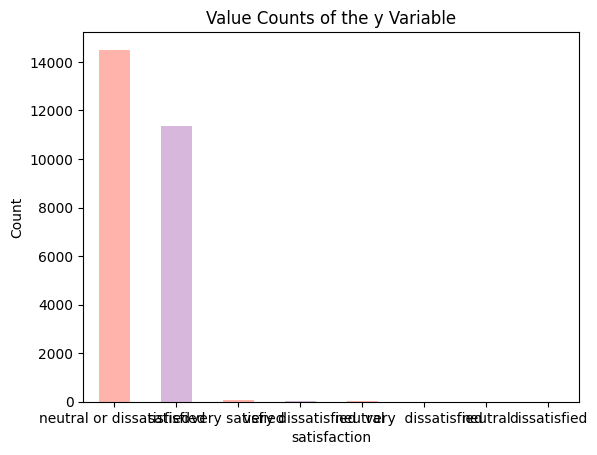

In [ ]:
df.satisfaction.value_counts().plot(kind="bar", color= ['#FFB3AB','#D8B7DD'])
plt.title("Value Counts of the y Variable")
plt.xlabel("satisfaction")
plt.xticks(rotation = 0)
plt.ylabel("Count")
plt.show()

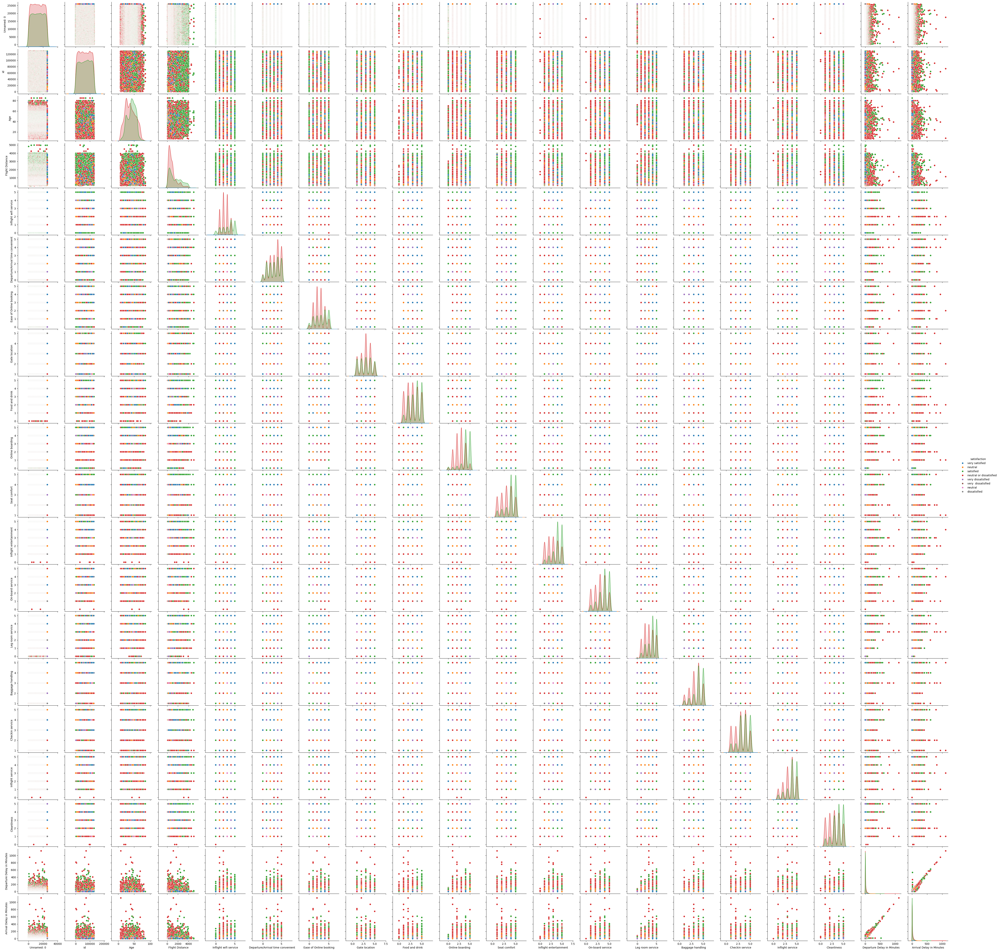

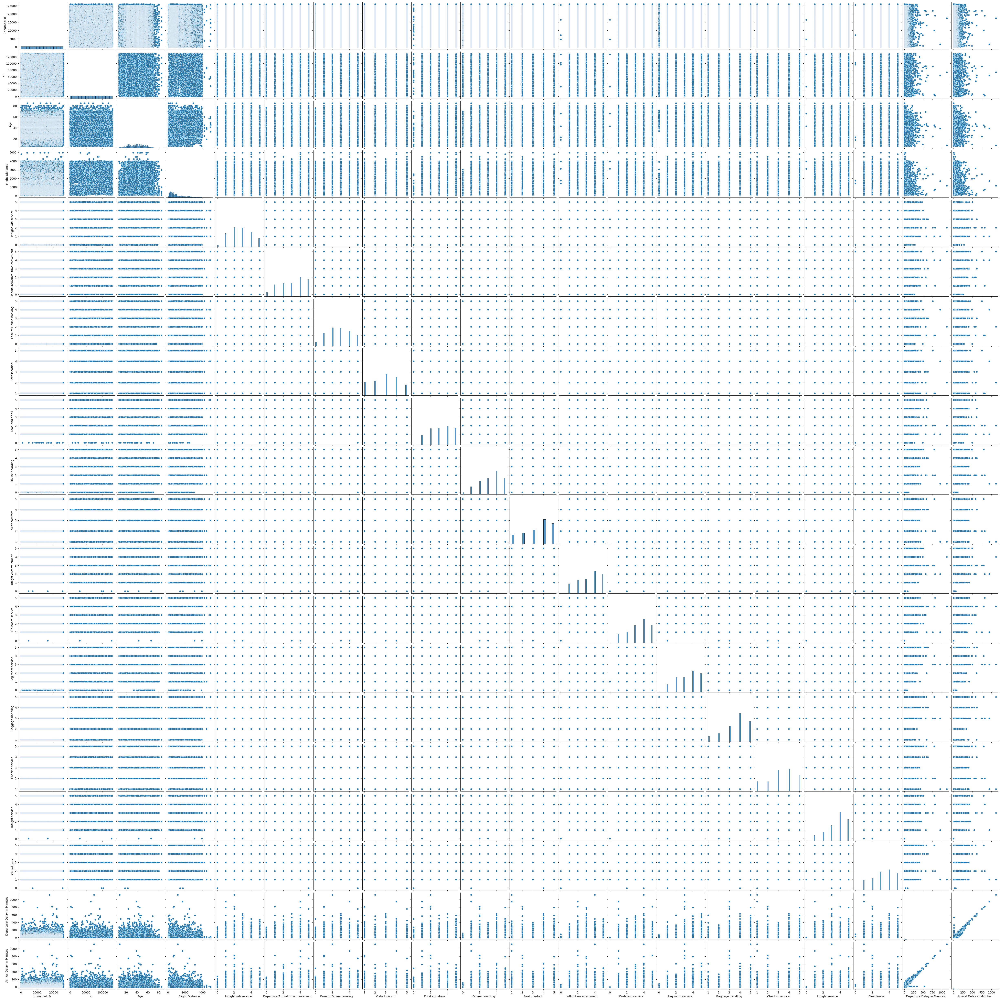

In [35]:
"""### Relationship Between Variables"""

sns.pairplot(df, hue = "satisfaction")
sns.pairplot(df)

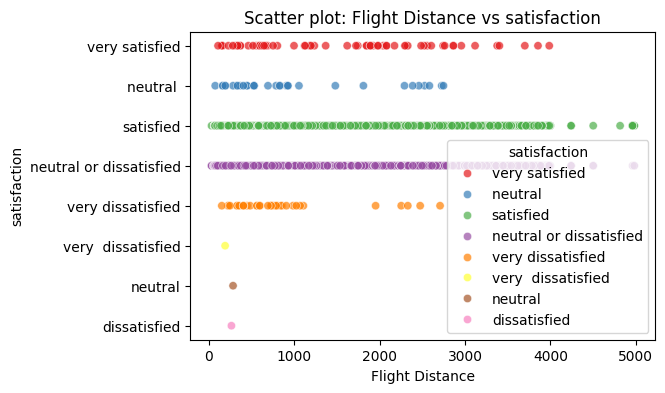

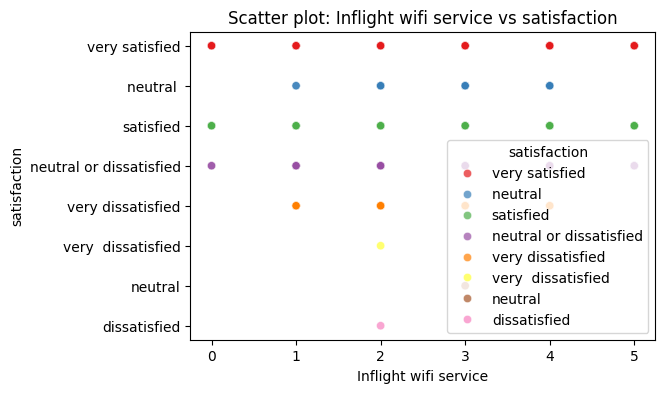

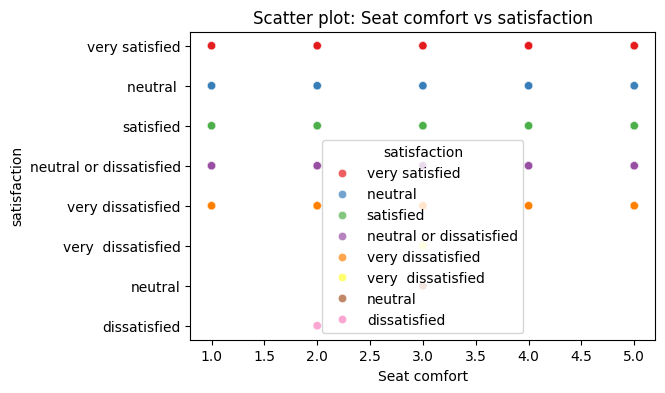

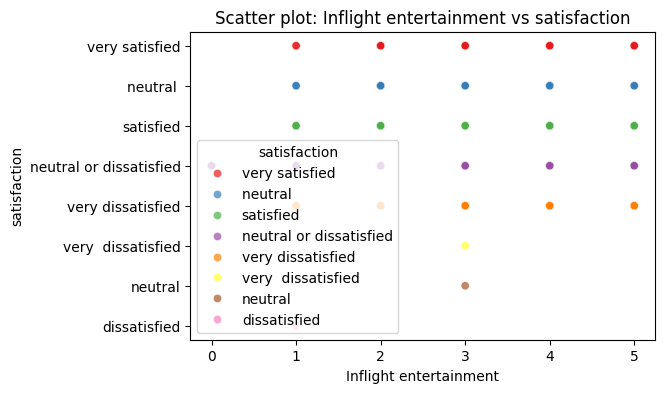

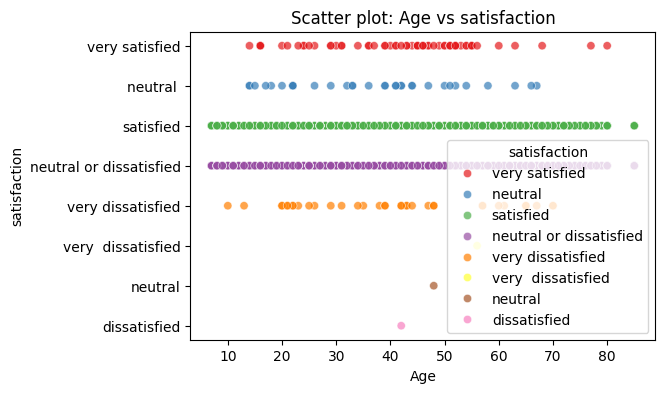

In [36]:
"""### Scatterplot → numeric vs numeric"""

numeric_cols = ['Flight Distance','Inflight wifi service', 'Seat comfort', 'Inflight entertainment', 'Age']

for col in numeric_cols:
    plt.figure(figsize=(6,4))
    sns.scatterplot(x=col, y='satisfaction', data=df, hue='satisfaction', palette="Set1", alpha=0.7)
    plt.title(f"Scatter plot: {col} vs satisfaction")
    plt.show()

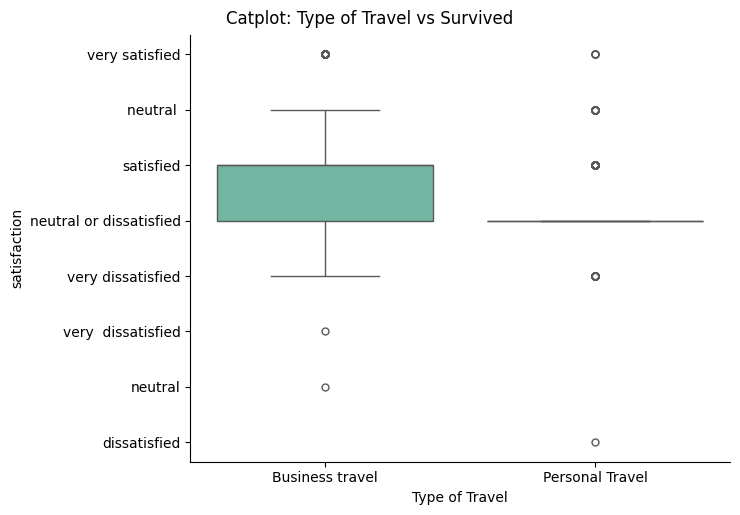

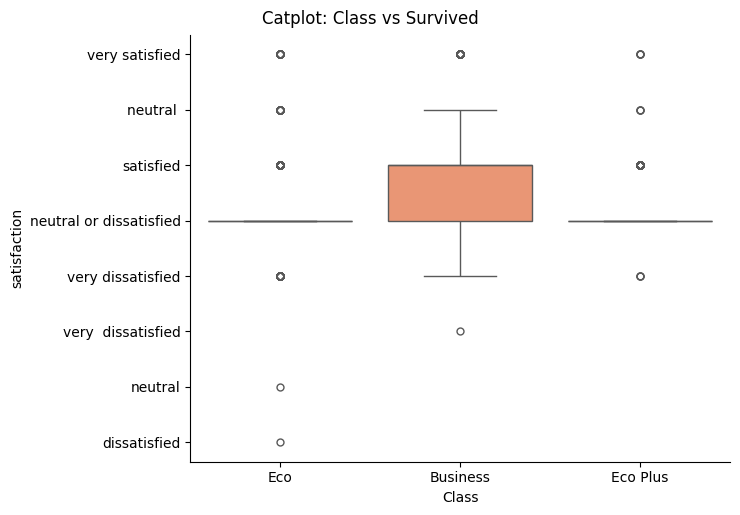

In [37]:
"""### Catplot → category + numeric"""

categorical_cols = ['Type of Travel', 'Class']

for col in categorical_cols:
    sns.catplot(x=col, y='satisfaction', data=df, kind='box', palette='Set2', height=5, aspect=1.5).fig.suptitle(f"Catplot: {col} vs Survived", y=1.02)


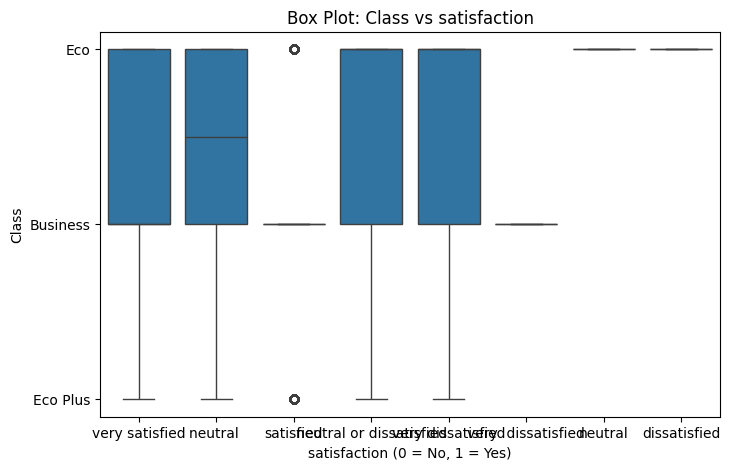

In [38]:
#Boxplot

plt.figure(figsize=(8, 5))
sns.boxplot(x='satisfaction', y='Class', data=df)
plt.title("Box Plot: Class vs satisfaction")
plt.xlabel("satisfaction (0 = No, 1 = Yes)")
plt.ylabel("Class")
plt.show()

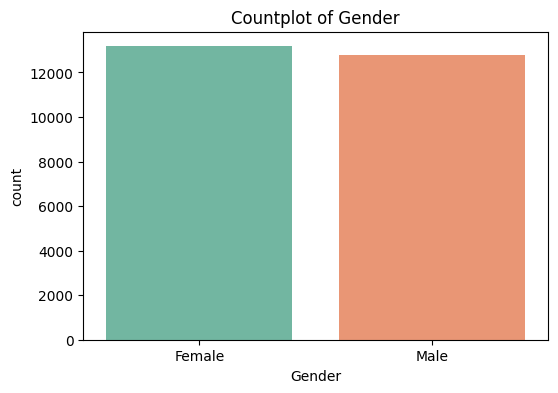

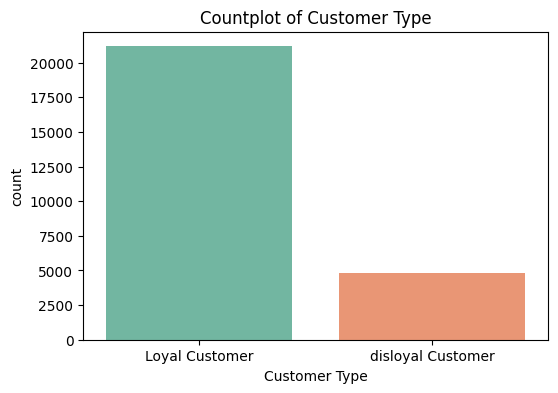

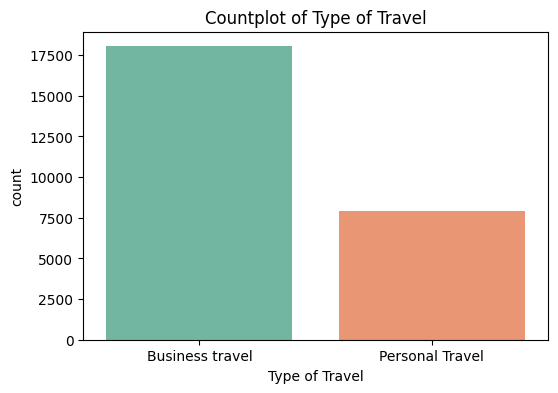

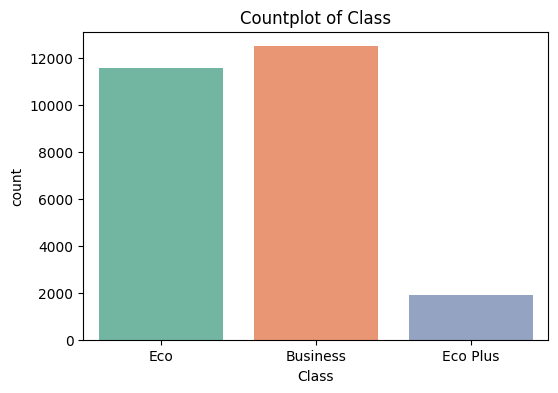

In [39]:
"""### Countplot → categorical only"""

categorical_cols = ['Gender', 'Customer Type', 'Type of Travel', 'Class']

for col in categorical_cols:
    plt.figure(figsize=(6,4))
    sns.countplot(x=col, data=df, palette="Set2")
    plt.title(f'Countplot of {col}')
    plt.show()

In [40]:
""### Sigmoid Function Curve"""

# Range
lim = 6
t = np.linspace(-lim, lim, 100)


In [41]:
# Sigmoid Function
sig = 1 / (1 + np.exp(-t))


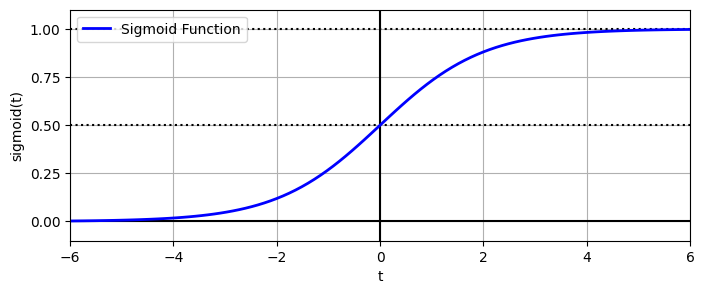

In [42]:
# Plot
plt.figure(figsize=(8, 3))

plt.plot([-lim, lim], [0, 0], "k-")       # horizontal axis line
plt.plot([-lim, lim], [0.5, 0.5], "k:")   # dotted line at 0.5
plt.plot([-lim, lim], [1, 1], "k:")       # dotted line at 1
plt.plot([0, 0], [-1.1, 1.1], "k-")       # vertical axis line

plt.plot(t, sig, "b-", linewidth=2, label="Sigmoid Function")

plt.xlabel("t")
plt.ylabel("sigmoid(t)")
plt.legend(loc="upper left")

plt.axis([-lim, lim, -0.1, 1.1])
plt.gca().set_yticks([0, 0.25, 0.5, 0.75, 1])
plt.grid()

plt.show()


Label Encoding

In [43]:
"""### Label Encoding"""

# Extracting categorical columns:
catFeatures= [col for col in df.columns if col in
              df.select_dtypes(include=object).columns]

from sklearn.preprocessing import LabelEncoder
X = df
# Encoding Categorical Data
labelEncode = LabelEncoder()

# Iterating Over each categorial features:
for col in catFeatures:
    # storing its numerical value:
    X[col] = labelEncode.fit_transform(df[col])


Corelation Matrix

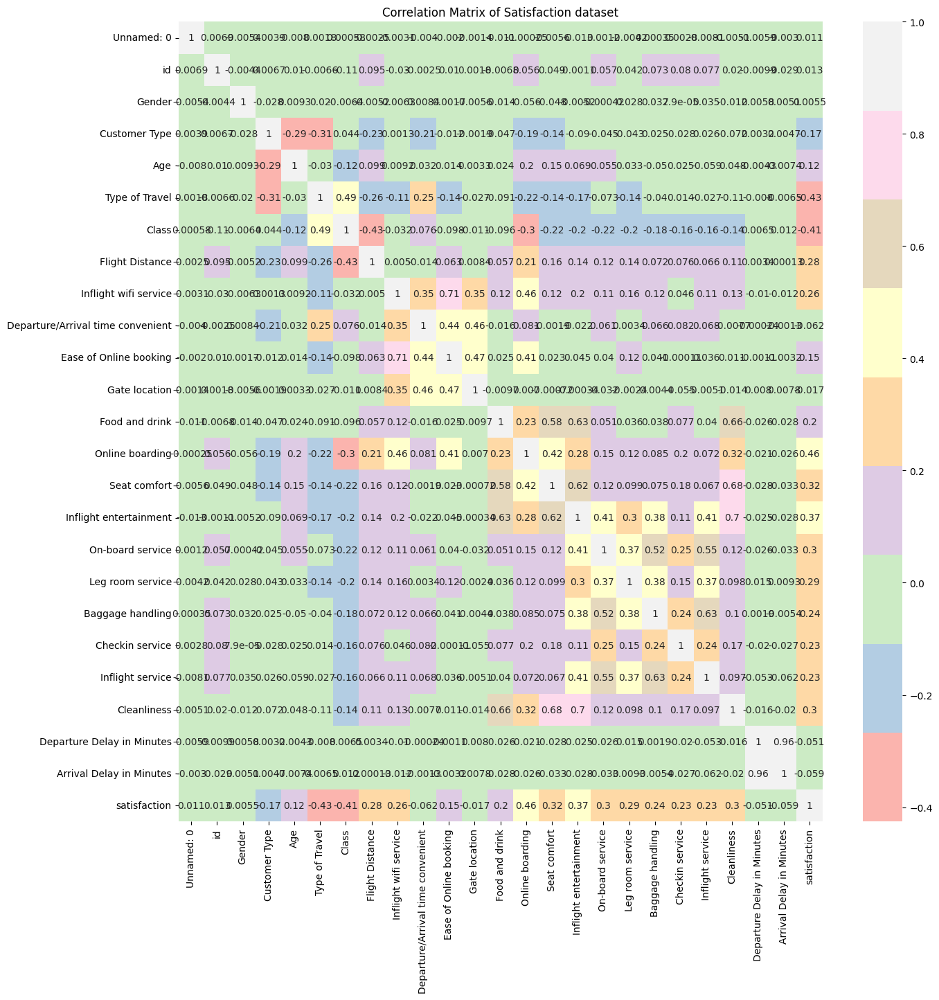

In [44]:
"""### Correlation Matrix"""

plt.figure(figsize=(15,15))
correlation_matrix =df.select_dtypes(include=['number']).corr()
sns.heatmap(correlation_matrix, annot=True, cmap='Pastel1')
plt.title('Correlation Matrix of Satisfaction dataset')
plt.show()


Pie Chart

Binary satisfaction ratio:
satisfaction
0    14573
1    11403
Name: count, dtype: int64


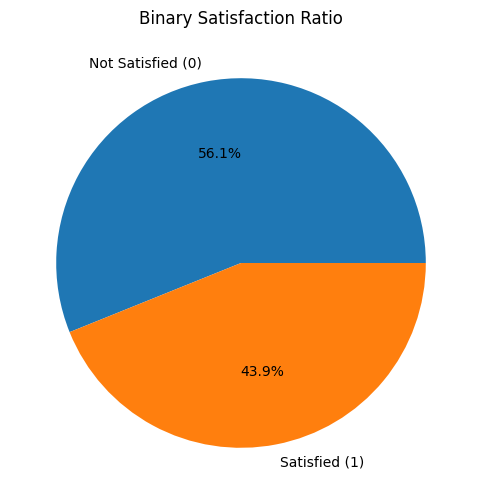

In [45]:
"""###Pie Chart"""

# Map the encoded satisfaction values to a binary target for the pie chart
# Assuming 'satisfied' and 'very satisfied' are positive (1), and others are negative/neutral (0).
# Based on previous value_counts: 4 (satisfied) and 7 (very satisfied)
binary_satisfaction_for_pie = df['satisfaction'].apply(lambda x: 1 if x in [4, 7] else 0)

# Count the new binary values
binary_counts = binary_satisfaction_for_pie.value_counts()

print("Binary satisfaction ratio:")
print(binary_counts)

# Pie Chart
plt.figure(figsize=(6,6))
plt.pie(binary_counts.values, labels=["Not Satisfied (0)", "Satisfied (1)"], autopct='%1.1f%%')
plt.title("Binary Satisfaction Ratio")
plt.show()

Model Train

In [46]:
"""### Train-Test Split"""

# Map the encoded satisfaction values to a binary target
# Assuming 'satisfied' and 'very satisfied' are positive (1), and others are negative/neutral (0).
# Based on previous value_counts: 4 (satisfied) and 7 (very satisfied)
y = df['satisfaction'].apply(lambda x: 1 if x in [4, 7] else 0)
X = df.drop(columns= ['Unnamed: 0', 'id', 'satisfaction'])


from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.80)
X_test.shape

(5196, 22)

In [47]:
X_test.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
21900,0,0,61,1,0,342,4,4,4,4,...,5,3,3,4,3,5,3,3,0,0.0
10375,1,0,37,0,2,377,3,4,4,4,...,3,3,4,1,4,1,4,3,32,13.0
9849,1,1,22,0,1,925,0,1,1,2,...,2,2,5,4,5,3,5,2,0,8.0
23325,1,0,42,0,0,3087,1,1,1,1,...,4,4,4,4,4,5,4,5,0,0.0
4174,1,0,45,0,0,479,5,5,5,5,...,1,5,5,5,5,1,5,1,37,13.0


In [48]:
X_train.shape

(20780, 22)

SMOTE

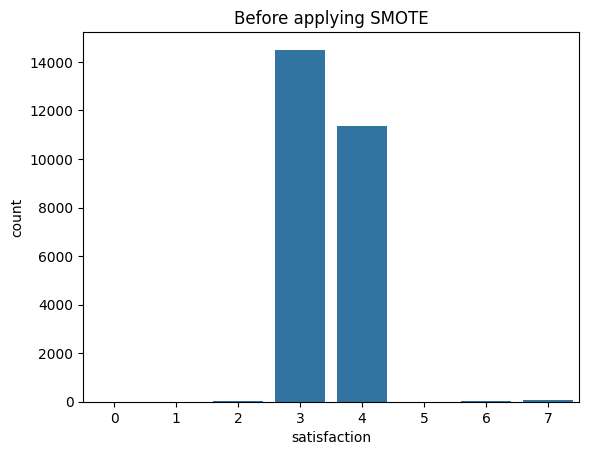

In [49]:
"""### Oversampling using SMOTE"""

from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_re, y_re = sm.fit_resample(X, y)
X_train, X_test, y_train, y_test = train_test_split(X_re, y_re, test_size = 0.25)
X.head()

sns.countplot(x ='satisfaction', data = df)
plt.title('Before applying SMOTE')
plt.show()


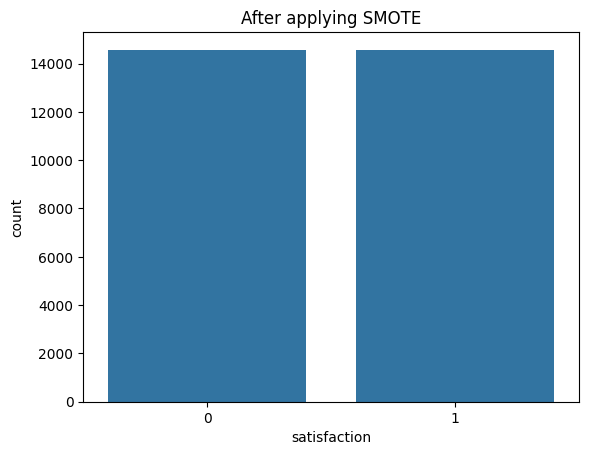

In [50]:
# Convert y_re to DataFrame for plotting
y_resampled_df = pd.DataFrame(y_re, columns=['satisfaction'])

# After SMOTE
sns.countplot(x='satisfaction', data=y_resampled_df)
plt.title('After applying SMOTE')
plt.show()


Pipeline

In [51]:
# Identify numerical features. At this stage, all features in X are numerical
# due to previous label encoding of categorical features.
numeric_features_for_preprocessing = X.columns.tolist()

# Define the preprocessor to scale numerical features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features_for_preprocessing)
    ],
    remainder='passthrough' # Keeps other columns if any, though all are transformed here
)

# Function to create pipeline for any model
def create_pipeline(model):
    return ImbPipeline(steps=[
        ('preprocessing', preprocessor),
        ('smote', SMOTE(random_state=42)),
        ('classifier', model)
    ])

In [52]:
pipelines = {
    "Logistic Regression": create_pipeline(LogisticRegression()),
    "Random Forest": create_pipeline(RandomForestClassifier()),
    "KNN": create_pipeline(KNeighborsClassifier()),
    "Decision Tree": create_pipeline(DecisionTreeClassifier()),
    "Naive Bayes": create_pipeline(GaussianNB()),
    "SVM": create_pipeline(SVC()),
    "XGBoost": create_pipeline(XGBClassifier())
}


Training and Evaluation

In [53]:
from sklearn.metrics import accuracy_score
for name, pipeline in pipelines.items():
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)

    print(f"\nModel: {name}")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))



Model: Logistic Regression
Accuracy: 0.8655139289145053
              precision    recall  f1-score   support

           0       0.86      0.87      0.87      3613
           1       0.87      0.86      0.87      3674

    accuracy                           0.87      7287
   macro avg       0.87      0.87      0.87      7287
weighted avg       0.87      0.87      0.87      7287


Model: Random Forest
Accuracy: 0.9521064910113901
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      3613
           1       0.96      0.95      0.95      3674

    accuracy                           0.95      7287
   macro avg       0.95      0.95      0.95      7287
weighted avg       0.95      0.95      0.95      7287


Model: KNN
Accuracy: 0.9175243584465487
              precision    recall  f1-score   support

           0       0.90      0.94      0.92      3613
           1       0.94      0.90      0.92      3674

    accuracy                     

ML Models

In [54]:
"""### Logistic Regression"""

X_test.head()

# Train Logistic Regression
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

y_pred = log_reg.predict(X_test)
from sklearn.metrics import accuracy_score
score = accuracy_score(y_test, y_pred)
accuracy = score*100
print("Accuracy:", accuracy)


Accuracy: 81.46013448607108


In [55]:
#  Display predicted vs actual
pred_vs_actual = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(pred_vs_actual.head(10))  # first 10 rows

#  Accuracy
accuracy = accuracy_score(y_test, y_pred) * 100
print(f"\nAccuracy: {accuracy:.2f}%")


       Actual  Predicted
8935        0          0
5170        0          0
5268        0          0
2620        0          0
8234        1          1
28626       1          1
15885       1          0
22527       0          0
4951        0          0
1700        0          0

Accuracy: 81.46%


In [56]:
y.value_counts()

,count
satisfaction,
0,14573
1,11403


In [57]:
# Confusion Matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

y_pred

y_test

from sklearn.metrics import confusion_matrix

# PRINT THE CONFUSION MATRIX
print("Confusion Matrix")
cm = confusion_matrix(y_test, y_pred)
print(cm)



Confusion Matrix:
[[2800  813]
 [ 538 3136]]
Confusion Matrix
[[2800  813]
 [ 538 3136]]


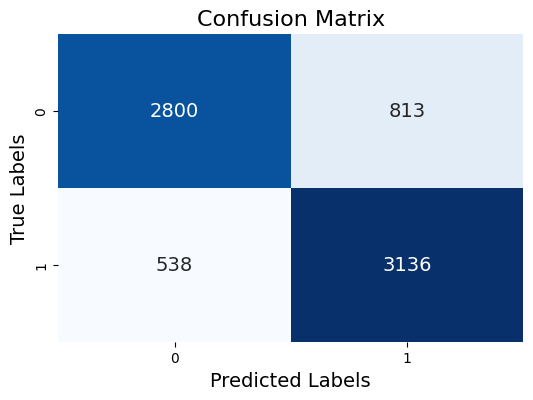

In [58]:
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, fmt = 'd', cmap = 'Blues', cbar = False, annot_kws = {'size' : 14})
plt.xlabel('Predicted Labels', fontsize = 14)
plt.ylabel('True Labels', fontsize = 14)
plt.title('Confusion Matrix', fontsize = 16)
plt.show()


In [59]:
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(y_test, y_pred)
print(report)


              precision    recall  f1-score   support

           0       0.84      0.77      0.81      3613
           1       0.79      0.85      0.82      3674

    accuracy                           0.81      7287
   macro avg       0.82      0.81      0.81      7287
weighted avg       0.82      0.81      0.81      7287



In [60]:
"""### Decision Boundary Plot for Time travel vs Flight distance

"""

# Select two features for plotting: Age and Flight Distance
x = X[["Type of Travel", "Flight Distance"]].values
Y = y.values # Use the already binarized target variable 'y'

x_train, x_test, Y_train, Y_test = train_test_split(x, Y, random_state=42)

In [61]:
#c=2 to behave as a linear regression
model = LogisticRegression(C=2, random_state=42)
model.fit(x_train, Y_train)

LogisticRegression(C=2, random_state=42)

In [62]:
import numpy as np

x0_min, x0_max = x[:, 0].min() - 0.5, x[:, 0].max() + 0.5
x1_min, x1_max = x[:, 1].min() - 10, x[:, 1].max() + 10

x0, x1 = np.meshgrid(np.linspace(x0_min, x0_max, 500),
                     np.linspace(x1_min, x1_max, 500))

X_new = np.c_[x0.ravel(), x1.ravel()]
y_proba = model.predict_proba(X_new)[:, 1]  # probability of satisfaction=1
zz = y_proba.reshape(x0.shape)


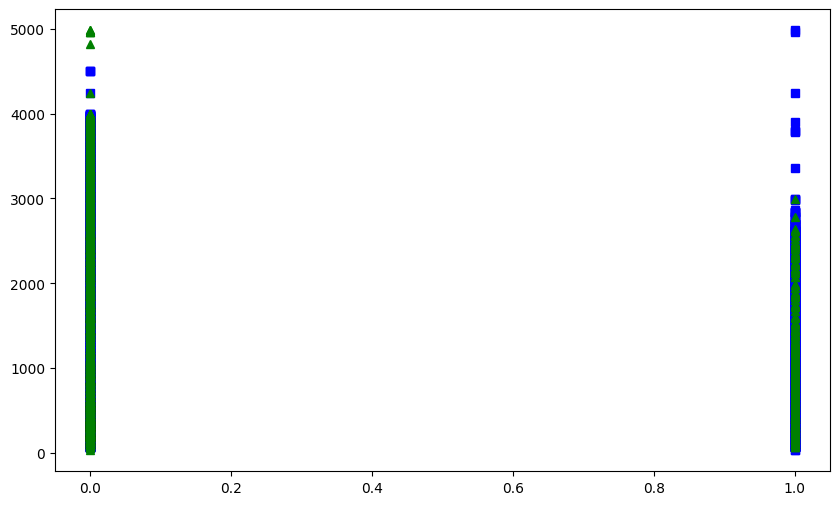

In [63]:
# Decision boundary line
left_right = np.array([x0_min, x0_max])
boundary = -((model.coef_[0, 0] * left_right + model.intercept_[0]) / model.coef_[0, 1])

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(x_train[Y_train == 0, 0], x_train[Y_train == 0, 1], "bs", label="Not satisfaction")
plt.plot(x_train[Y_train == 1, 0], x_train[Y_train == 1, 1], "g^", label="satisfaction")


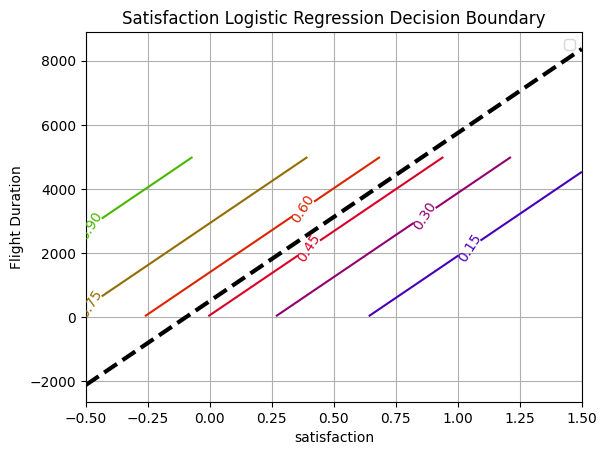

In [64]:
contour = plt.contour(x0, x1, zz, cmap=plt.cm.brg)
plt.clabel(contour, inline=1)
plt.plot(left_right, boundary, "k--", linewidth=3)

plt.xlabel("satisfaction")
plt.ylabel("Flight Duration")
plt.title("Satisfaction Logistic Regression Decision Boundary")
plt.grid()
plt.legend()
plt.show()

Models

In [65]:
models = {
    "                   Logistic Regression": LogisticRegression(),
    "                  Gaussian Naive Bayes": GaussianNB(),
    "                   K-Nearest Neighbors": KNeighborsClassifier(),
    "                Support Vector Machine": SVC(),
    "                          RandomForest": RandomForestClassifier(),
    "                    XGBoost Classifier": XGBClassifier(),
}


for name, model in models.items():
    model.fit(X_train, y_train)
    print(name + " trained.")

                   Logistic Regression trained.
                  Gaussian Naive Bayes trained.
                   K-Nearest Neighbors trained.
                Support Vector Machine trained.
                          RandomForest trained.
                    XGBoost Classifier trained.


In [66]:
for name, model in models.items():
    print(name + ": {:.2f}%".format(model.score(X_test, y_test) * 100))

                   Logistic Regression: 81.46%
                  Gaussian Naive Bayes: 85.25%
                   K-Nearest Neighbors: 70.92%
                Support Vector Machine: 65.01%
                          RandomForest: 95.24%
                    XGBoost Classifier: 95.77%


Model Summary

In [67]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

results = {}   # to store all model scores

for name, model in models.items():
    # Train Model
    model.fit(X_train, y_train)

    # Predict
    y_pred = model.predict(X_test)

    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Store results
    results[name] = {
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1
    }

    print("====================================================")
    print(f"Model: {name}")
    print(classification_report(y_test, y_pred))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    print("====================================================\n")

# Display sorted results
print("\n\n======= MODEL PERFORMANCE SUMMARY =======\n")

for name, metrics in sorted(results.items(), key=lambda x: x[1]["Accuracy"], reverse=True):
    print(f"{name}: "
          f"Accuracy={metrics['Accuracy']:.4f}, "
          f"Precision={metrics['Precision']:.4f}, "
          f"Recall={metrics['Recall']:.4f}, "
          f"F1 Score={metrics['F1 Score']:.4f}")


Model:                    Logistic Regression
              precision    recall  f1-score   support

           0       0.84      0.77      0.81      3613
           1       0.79      0.85      0.82      3674

    accuracy                           0.81      7287
   macro avg       0.82      0.81      0.81      7287
weighted avg       0.82      0.81      0.81      7287

Confusion Matrix:
 [[2800  813]
 [ 538 3136]]

Model:                   Gaussian Naive Bayes
              precision    recall  f1-score   support

           0       0.83      0.88      0.86      3613
           1       0.88      0.82      0.85      3674

    accuracy                           0.85      7287
   macro avg       0.85      0.85      0.85      7287
weighted avg       0.85      0.85      0.85      7287

Confusion Matrix:
 [[3195  418]
 [ 657 3017]]

Model:                    K-Nearest Neighbors
              precision    recall  f1-score   support

           0       0.72      0.67      0.70      3613
     

Confusion Matrix

Confusion Matrix
[[2800  813]
 [ 538 3136]]


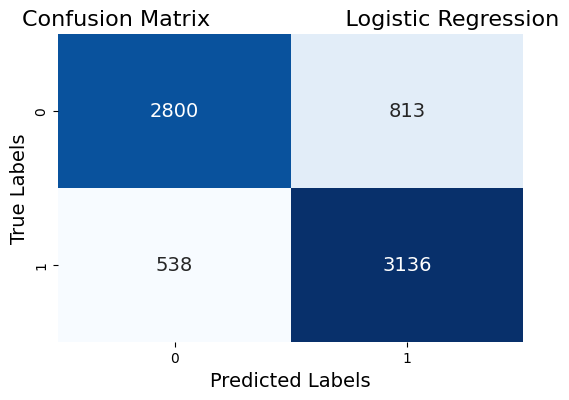

Confusion Matrix
[[3195  418]
 [ 657 3017]]


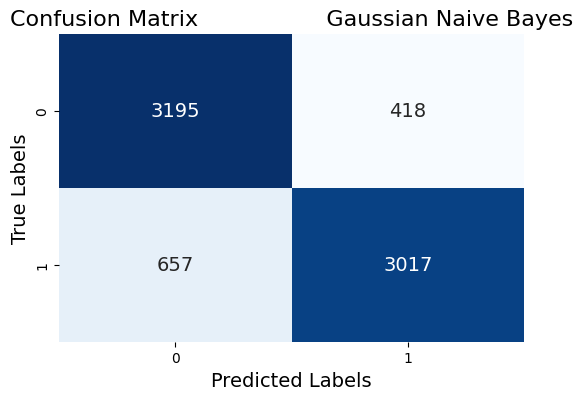

Confusion Matrix
[[2437 1176]
 [ 943 2731]]


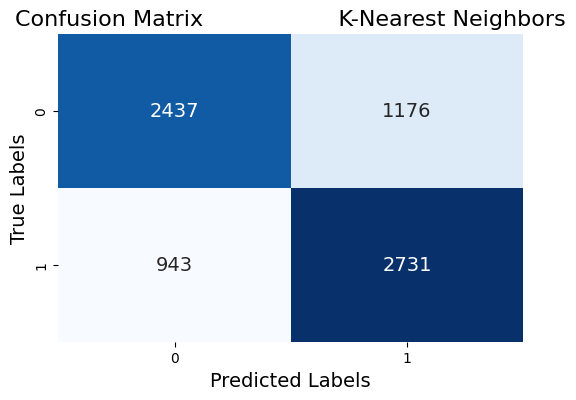

Confusion Matrix
[[2940  673]
 [1877 1797]]


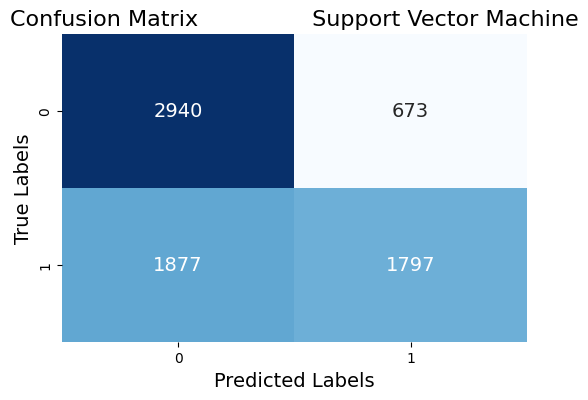

Confusion Matrix
[[3469  144]
 [ 205 3469]]


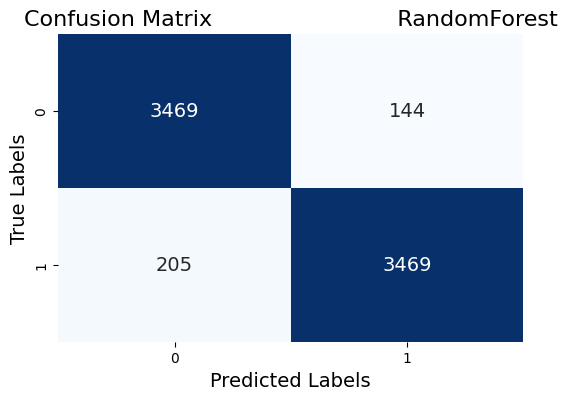

Confusion Matrix
[[3486  127]
 [ 181 3493]]


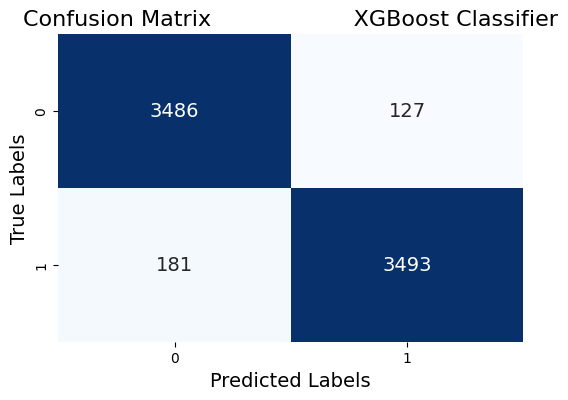

In [68]:
for name, model in models.items():
  y_pred = model.predict(X_test)
  # PRINT THE CONFUSION MATRIX
  print("Confusion Matrix")
  cm = confusion_matrix(y_test, y_pred)
  print(cm)
  plt.figure(figsize = (6, 4))
  sns.heatmap(cm, annot = True, fmt = 'd', cmap = 'Blues', cbar = False, annot_kws = {'size' : 14})
  plt.xlabel('Predicted Labels', fontsize = 14)
  plt.ylabel('True Labels', fontsize = 14)
  plt.title(f'Confusion Matrix{name}', fontsize = 16)
  plt.show()

Classification report

In [69]:
from sklearn.metrics import classification_report
report = (classification_report(y_test, y_pred))
print(report)

              precision    recall  f1-score   support

           0       0.95      0.96      0.96      3613
           1       0.96      0.95      0.96      3674

    accuracy                           0.96      7287
   macro avg       0.96      0.96      0.96      7287
weighted avg       0.96      0.96      0.96      7287



In [70]:
import pickle
# with open('model.pkl','wb') as f:
# pickle.dump(model, f)
with open('model.pkl', 'wb') as f:
    pickle.dump(model, f)
    print("Model saved as 'model.pkl'")

Model saved as 'model.pkl'


In [71]:
print("\nSaved best pipeline to 'satisfaction_best_pipeline.pickle'")


Saved best pipeline to 'satisfaction_best_pipeline.pickle'
